# phase 3 


First, we'll assess whether our dataset is balanced or imbalanced. In Phase 2, after preprocessing our dataset, we'll proceed with applying classification and clustering methods. Finally, we'll evaluate the performance of these methods.


In [1]:
import pandas as pd
df = pd.read_csv("Processed_dataset.csv",sep=",")
x = df['Flexibility Level']

num_high = x[x == 1].count()
num_low = x[x == 0].count()

total = num_high + num_low
percentage_high = (num_high / total) * 100
percentage_low = (num_low / total) * 100

print("Number of high :", num_high)
print("Number of low:", num_low)
print("___")
print("Percentage of high : {:.2f}%".format(percentage_high))
print("Percentage of low : {:.2f}%".format(percentage_low))

Number of high : 123
Number of low: 123
___
Percentage of high : 50.00%
Percentage of low : 50.00%


# 1-  loading data : 

In [2]:
import pandas as pd
from scipy import stats
from sklearn.tree import DecisionTreeClassifier 
from sklearn.model_selection import train_test_split
from sklearn import metrics 
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from sklearn import tree

df = pd.read_csv("Processed_dataset.csv")
df

,Education Level,Institution Type,Gender,Age,Device,IT Student,Location,Financial Condition,Internet Type,Network Type,Flexibility Level
0,2,0,1,0.777778,2,0,1,0,1,2,1
1,2,0,0,0.777778,1,0,1,0,0,2,1
2,0,1,0,0.500000,1,0,1,0,1,2,1
3,1,0,0,0.111111,1,0,1,0,0,2,1
4,1,0,0,0.500000,1,0,1,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...
241,0,1,0,0.500000,1,0,0,0,0,2,0
242,2,1,1,0.777778,1,0,0,0,0,1,0
243,1,1,0,0.289917,1,0,1,0,1,2,0
244,2,1,0,0.777778,1,0,1,0,1,2,0


# 2- Feature Selection:

In [3]:
fn= df.keys().tolist()[:-1]
X= df[fn]
y=df['Flexibility Level']
X

,Education Level,Institution Type,Gender,Age,Device,IT Student,Location,Financial Condition,Internet Type,Network Type
0,2,0,1,0.777778,2,0,1,0,1,2
1,2,0,0,0.777778,1,0,1,0,0,2
2,0,1,0,0.500000,1,0,1,0,1,2
3,1,0,0,0.111111,1,0,1,0,0,2
4,1,0,0,0.500000,1,0,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...
241,0,1,0,0.500000,1,0,0,0,0,2
242,2,1,1,0.777778,1,0,0,0,0,1
243,1,1,0,0.289917,1,0,1,0,1,2
244,2,1,0,0.777778,1,0,1,0,1,2


# 3- Splitting Data into: 

Now, we'll conduct experiments to determine the optimal size for splitting our dataset into training and testing sets. This process will help us choose the appropriate ratio for training and testing data, ensuring reliable model evaluation.

## Splitting Data into: 90% Training and 10% Test


- Information Gain (entropy):

In [4]:
from sklearn.tree import DecisionTreeClassifier
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=1)

clf = DecisionTreeClassifier(criterion='entropy')

clf = clf. fit (X_train, y_train)

y_pred = clf.predict (X_test)

### - DecisionTree

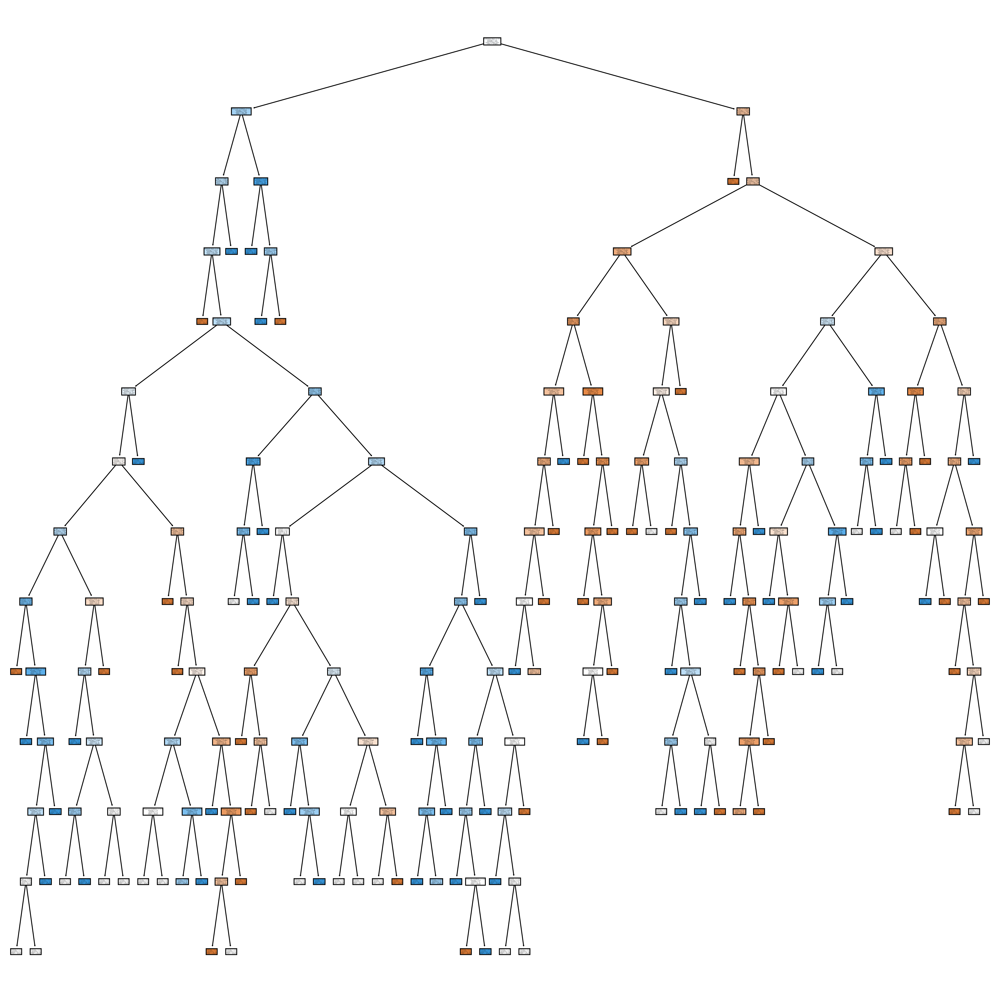

In [5]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 20), dpi=300)


class_labels = {0: 'o(low)' , 1:'1(high)'}

tree.plot_tree(clf,
               feature_names=fn,
               class_names=[class_labels[0], class_labels[1]], 
               filled=True
               )

plt.show()

### confusion matrix :

[[8 6]
 [4 7]]


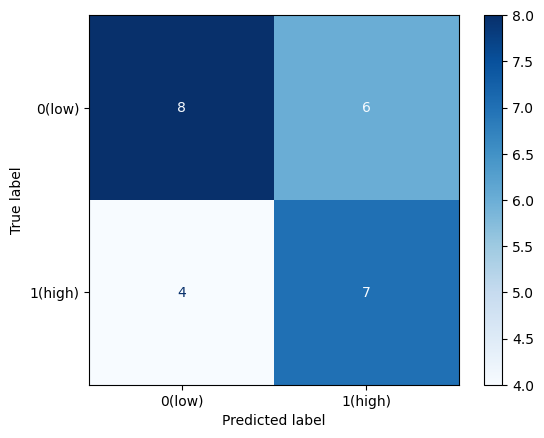

In [6]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Compute and print the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)


# Assuming you already have cm, y_test, and y_pred computed
cm = confusion_matrix(y_test, y_pred)

class_labels = {0: '0(low)', 1: '1(high)'}
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[class_labels[0], class_labels[1]])
disp.plot(cmap=plt.cm.Blues)
plt.show()

### now lets evaluatie this spliting 

In [8]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred) )

Accuracy: 0.6


In [9]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Compute and print the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print("confusion matrix : \n",cm)

# Compute Accuracy
accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Error Rate is simply 1 minus the Accuracy
error_rate = 1 - accuracy
print("Error Rate:", error_rate)

# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm[1, 1]
TN = cm[0, 0]
FP = cm[0, 1]
FN = cm[1, 0]

# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)

# Specificity 
specificity = TN / (TN + FP)
print("Specificity:", specificity)

# Precision 
precision = TP / (TP + FP)
print("Precision:", precision)

confusion matrix : 
 [[8 6]
 [4 7]]
Accuracy: 0.6
Error Rate: 0.4
Sensitivity: 0.6363636363636364
Specificity: 0.5714285714285714
Precision: 0.5384615384615384


Accuracy:
Accuracy measures the proportion of correctly classified instances out of total instances.
In this case, the accuracy is 0.6 or 60%, indicating that approximately 60% of instances are correctly classified.
- - - - - 
Error Rate:
Error Rate (Misclassification Rate) measures the proportion of incorrectly classified instances out of total instances.
The error rate is 0.4 or 40%, meaning that about 40% of instances are misclassified.
- - - - - -
Sensitivity (True Positive Rate):
Sensitivity measures the proportion of actual positive instances that are correctly identified.
The sensitivity is approximately 63.64%, suggesting that about 63.64% of actual positive instances are correctly identified.
- - - - -  -
Specificity (True Negative Rate):
Specificity measures the proportion of actual negative instances that are correctly identified.
The specificity is approximately 57.14%, indicating that about 57.14% of actual negative instances are correctly identified.
- - - - - -
Precision (Positive Predictive Value):
Precision measures the proportion of correctly predicted positive instances out of total predicted positive instances.
The precision is approximately 53.85%, meaning that about 53.85% of the instances predicted as positive are actually positive.
- - - - - 
Overall, the model exhibits moderate performance:

It correctly classifies about 60% of instances, which is reasonable but leaves room for improvement.
The error rate of 40% indicates a significant proportion of misclassified instances.
Sensitivity and specificity values suggest a moderate ability to correctly identify positive and negative instances, respectively.
Precision, however, is relatively low at approximately 53.85%, indicating that positive predictions have room for enhancement.
In summary, while the model demonstrates some effectiveness, there are areas where improvement is needed, particularly in reducing the error rate and increasing precision. Further refinement and optimization of the model may be necessary to achieve better performance.

### - Gini Index:

In [10]:
from sklearn.tree import DecisionTreeClassifier
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=1)

clf = DecisionTreeClassifier(criterion='gini')

clf = clf. fit (X_train, y_train)

y_pred = clf.predict (X_test)

### - DecisionTree

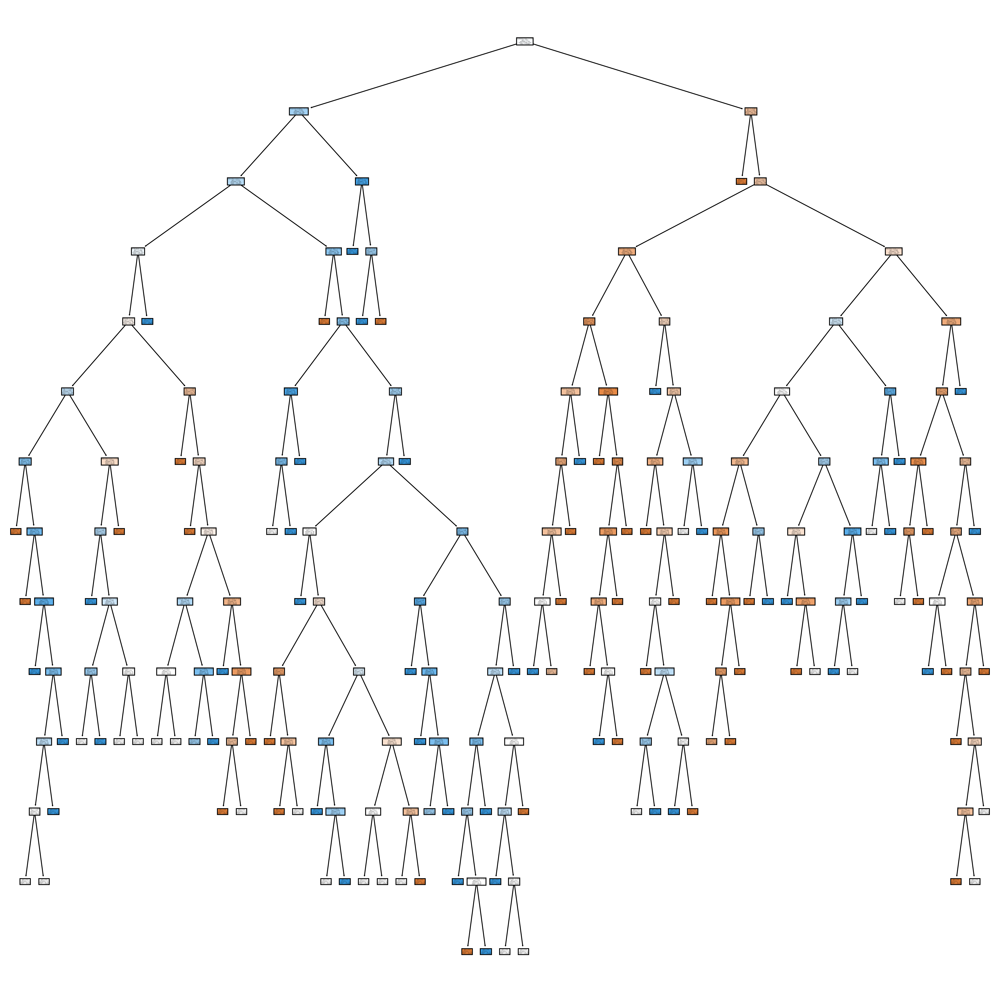

In [11]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 20), dpi=300)


class_labels = {0: 'o(low)' , 1:'1(high)'}

tree.plot_tree(clf,
               feature_names=fn,
               class_names=[class_labels[0], class_labels[1]], 
               filled=True
               )

plt.show()

### confusion matrix :

[[8 6]
 [4 7]]


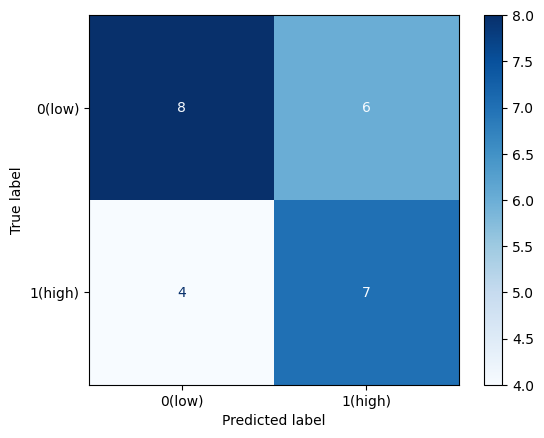

In [12]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Compute and print the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)


# Assuming you already have cm, y_test, and y_pred computed
cm = confusion_matrix(y_test, y_pred)

class_labels = {0: '0(low)', 1: '1(high)'}
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[class_labels[0], class_labels[1]])
disp.plot(cmap=plt.cm.Blues)
plt.show()

### now lets evaluatie this spliting 

In [13]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# Compute and print the confusion matrix
cm4 = confusion_matrix(y_test, y_pred)
print("confusion matrix : \n",cm4)


# Compute Accuracy
accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


# Error Rate is simply 1 minus the Accuracy
error_rate = 1 - accuracy
print("Error Rate:", error_rate)


# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm4[1, 1]
TN = cm4[0, 0]
FP = cm4[0, 1]
FN = cm4[1, 0]


# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)


# Specificity 
specificity = TN / (TN + FP)
print("Specificity:", specificity)


# Precision 
precision = TP / (TP + FP)
print("Precision:", precision)

confusion matrix : 
 [[8 6]
 [4 7]]
Accuracy: 0.6
Error Rate: 0.4
Sensitivity: 0.6363636363636364
Specificity: 0.5714285714285714
Precision: 0.5384615384615384


Accuracy:
Accuracy measures the proportion of correctly classified instances out of total instances.
In this case, the accuracy is 0.6 or 60%, indicating that approximately 60% of instances are correctly classified.
- - - - - -
Error Rate:
Error Rate (Misclassification Rate) measures the proportion of incorrectly classified instances out of total instances.
The error rate is 0.4 or 40%, meaning that about 40% of instances are misclassified.
- - - - - -
Sensitivity (True Positive Rate):
Sensitivity measures the proportion of actual positive instances that are correctly identified.
The sensitivity is approximately 63.64%, suggesting that about 63.64% of actual positive instances are correctly identified.
- - - - - -
Specificity (True Negative Rate):
Specificity measures the proportion of actual negative instances that are correctly identified.
The specificity is approximately 57.14%, indicating that about 57.14% of actual negative instances are correctly identified.
- - - - - -
Precision (Positive Predictive Value):
Precision measures the proportion of correctly predicted positive instances out of total predicted positive instances.
The precision is approximately 53.85%, meaning that about 53.85% of the instances predicted as positive are actually positive.
- - - - - - 
Overall, the model achieves moderate accuracy, but there is room for improvement, especially in terms of reducing the error rate and increasing precision. The sensitivity and specificity values suggest that the model performs reasonably well in identifying both positive and negative instances, but precision could be improved, indicating a need for better positive prediction capability. Further analysis and model refinement may be required to enhance the performance of the classifier.







## Splitting Data into: 70% Training and 30% Test


- Information Gain (entropy):

In [14]:
from sklearn.tree import DecisionTreeClassifier
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

clf = DecisionTreeClassifier(criterion='entropy')

clf = clf. fit (X_train, y_train)

y_pred = clf.predict (X_test)

### - DecisionTree

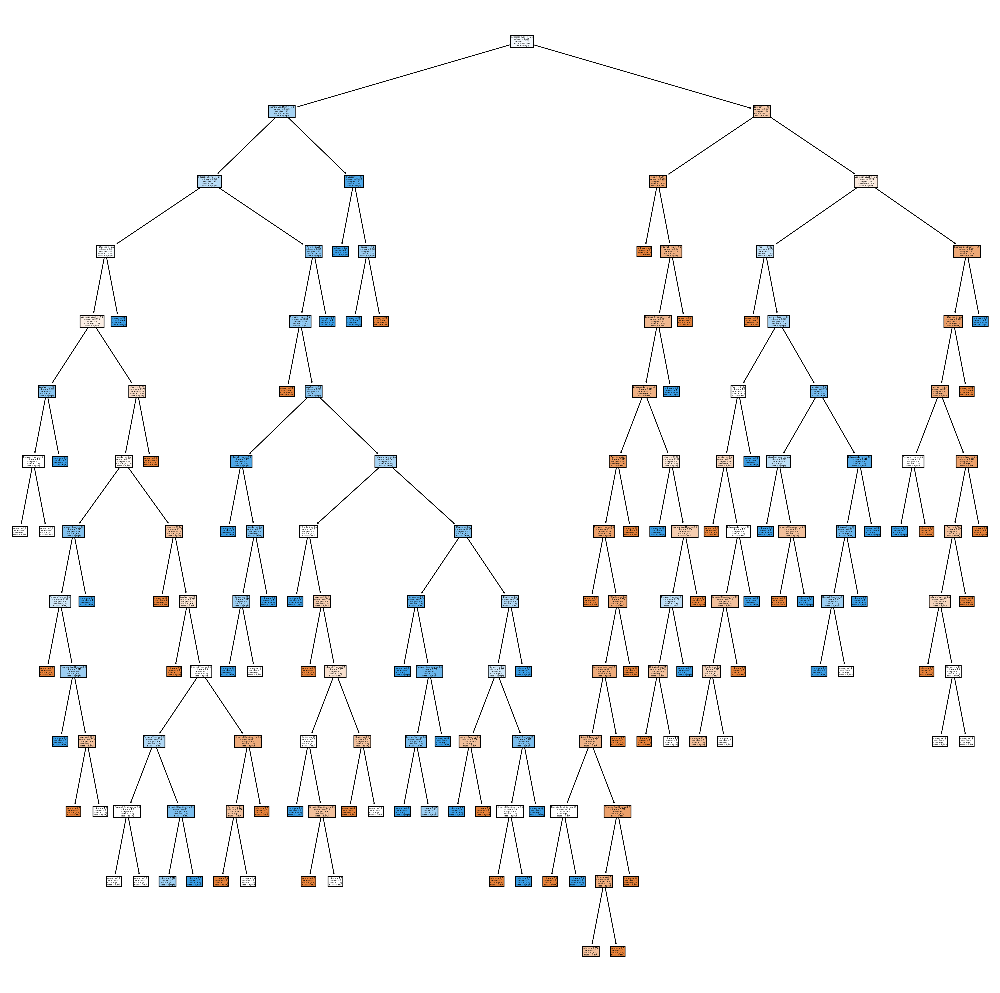

In [15]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 20), dpi=300)


class_labels = {0: 'o(low)' , 1:'1(high)'}

tree.plot_tree(clf,
               feature_names=fn,
               class_names=[class_labels[0], class_labels[1]], 
               filled=True
               )

plt.show()

### confusion matrix :

[[31  9]
 [17 17]]


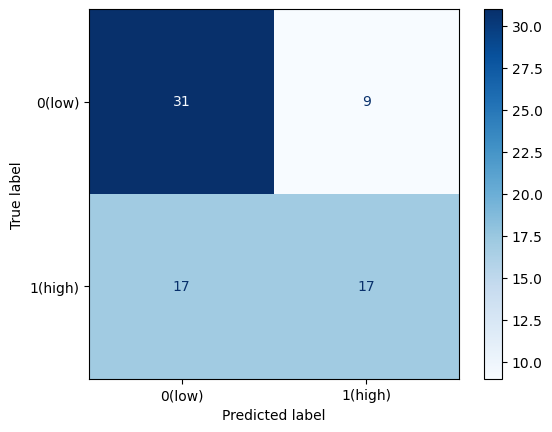

In [16]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Compute and print the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)


# Assuming you already have cm, y_test, and y_pred computed
cm = confusion_matrix(y_test, y_pred)

class_labels = {0: '0(low)', 1: '1(high)'}
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[class_labels[0], class_labels[1]])
disp.plot(cmap=plt.cm.Blues)
plt.show()

### now lets evaluatie this spliting 

In [17]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred) )

Accuracy: 0.6486486486486487


In [18]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Compute and print the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print("confusion matrix : \n",cm)

# Compute Accuracy
accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Error Rate is simply 1 minus the Accuracy
error_rate = 1 - accuracy
print("Error Rate:", error_rate)

# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm[1, 1]
TN = cm[0, 0]
FP = cm[0, 1]
FN = cm[1, 0]

# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)

# Specificity 
specificity = TN / (TN + FP)
print("Specificity:", specificity)

# Precision 
precision = TP / (TP + FP)
print("Precision:", precision)

confusion matrix : 
 [[31  9]
 [17 17]]
Accuracy: 0.6486486486486487
Error Rate: 0.3513513513513513
Sensitivity: 0.5
Specificity: 0.775
Precision: 0.6538461538461539


Accuracy:
Accuracy measures the proportion of correctly classified instances out of total instances.
In this case, the accuracy is approximately 64.86%, indicating that around 64.86% of instances are correctly classified.
- - - - -
Error Rate:
Error Rate (Misclassification Rate) measures the proportion of incorrectly classified instances out of total instances.
The error rate is approximately 35.14%, meaning that about 35.14% of instances are misclassified.
- - - - -
Sensitivity (True Positive Rate):
Sensitivity measures the proportion of actual positive instances that are correctly identified.
The sensitivity is 50%, suggesting that only 50% of actual positive instances are correctly identified.
- - - - -
Specificity (True Negative Rate):
Specificity measures the proportion of actual negative instances that are correctly identified.
The specificity is 77.5%, indicating that about 77.5% of actual negative instances are correctly identified.
- - - - - -
Precision (Positive Predictive Value):
Precision measures the proportion of correctly predicted positive instances out of total predicted positive instances.
The precision is approximately 65.38%, meaning that about 65.38% of the instances predicted as positive are actually positive.
- - - - - -
Overall, the model achieves moderate accuracy, but there is room for improvement, especially in terms of increasing sensitivity. The specificity and precision values are relatively high, indicating that the model performs well in correctly identifying negative instances and making positive predictions. However, efforts may be needed to enhance its ability to correctly identify positive instances.







### - Gini Index:

In [19]:
from sklearn.tree import DecisionTreeClassifier
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

clf = DecisionTreeClassifier(criterion='gini')

clf = clf. fit (X_train, y_train)

y_pred = clf.predict (X_test)

### Decision Trees:

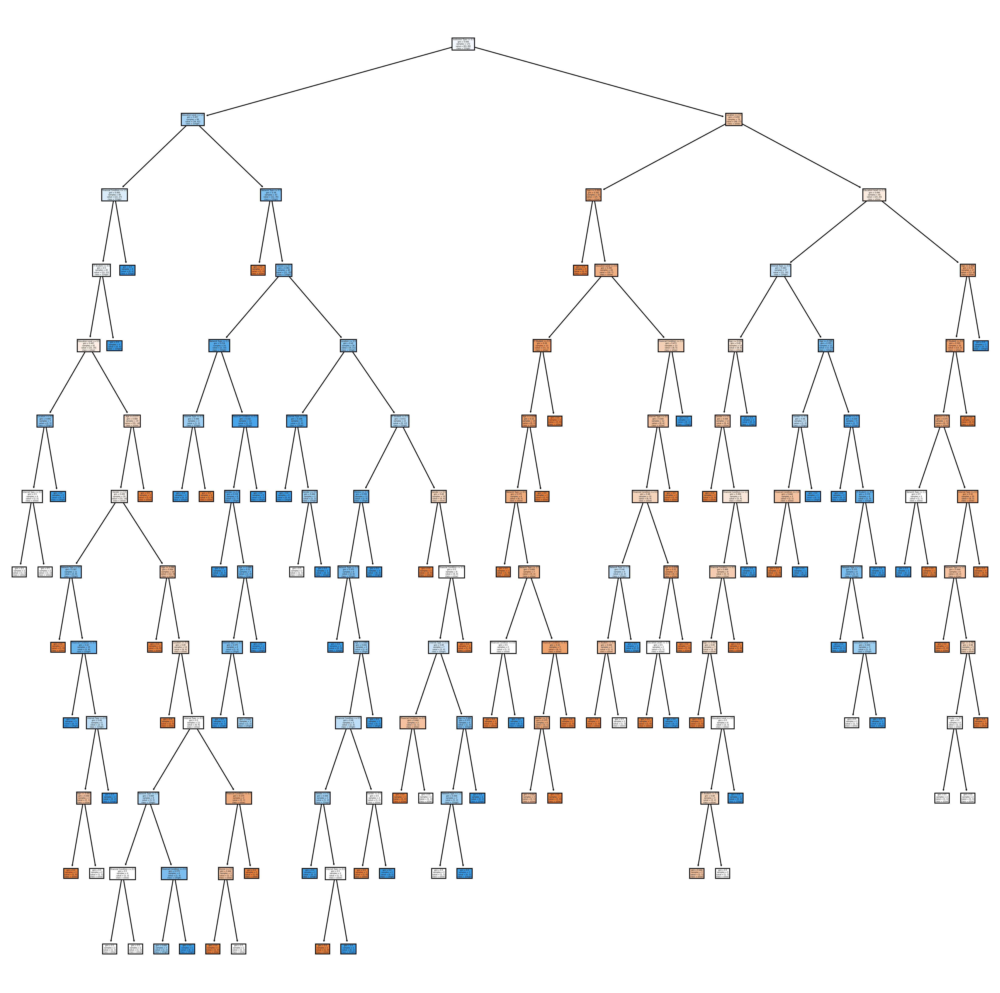

In [20]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 20), dpi=300)


class_labels = {0: 'o(low)' , 1:'1(high)'}

tree.plot_tree(clf,
               feature_names=fn,
               class_names=[class_labels[0], class_labels[1]], 
               filled=True
               )

plt.show()

### confusion matrix :

[[27 13]
 [16 18]]


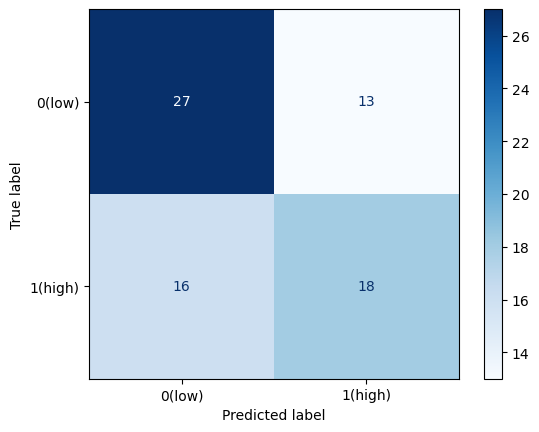

In [21]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Compute and print the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)


# Assuming you already have cm, y_test, and y_pred computed
cm = confusion_matrix(y_test, y_pred)

class_labels = {0: '0(low)', 1: '1(high)'}
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[class_labels[0], class_labels[1]])
disp.plot(cmap=plt.cm.Blues)
plt.show()

In [22]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# Compute and print the confusion matrix
cm4 = confusion_matrix(y_test, y_pred)
print("confusion matrix : \n",cm4)


# Compute Accuracy
accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


# Error Rate is simply 1 minus the Accuracy
error_rate = 1 - accuracy
print("Error Rate:", error_rate)


# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm4[1, 1]
TN = cm4[0, 0]
FP = cm4[0, 1]
FN = cm4[1, 0]


# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)


# Specificity 
specificity = TN / (TN + FP)
print("Specificity:", specificity)


# Precision 
precision = TP / (TP + FP)
print("Precision:", precision)

confusion matrix : 
 [[27 13]
 [16 18]]
Accuracy: 0.6081081081081081
Error Rate: 0.3918918918918919
Sensitivity: 0.5294117647058824
Specificity: 0.675
Precision: 0.5806451612903226


Accuracy:
Accuracy measures the proportion of correctly classified instances out of total instances.
In this case, the accuracy is approximately 60.81%, indicating that around 60.81% of instances are correctly classified.
- - - - -
Error Rate:
Error Rate (Misclassification Rate) measures the proportion of incorrectly classified instances out of total instances.
The error rate is approximately 39.19%, meaning that about 39.19% of instances are misclassified.
- - - - - -
Sensitivity (True Positive Rate):
Sensitivity measures the proportion of actual positive instances that are correctly identified.
The sensitivity is approximately 52.94%, suggesting that only 52.94% of actual positive instances are correctly identified.
- - - - - -
Specificity (True Negative Rate):
Specificity measures the proportion of actual negative instances that are correctly identified.
The specificity is 67.5%, indicating that about 67.5% of actual negative instances are correctly identified.
- - - - - -
Precision (Positive Predictive Value):
Precision measures the proportion of correctly predicted positive instances out of total predicted positive instances.
The precision is approximately 58.06%, meaning that about 58.06% of the instances predicted as positive are actually positive.
- - - - - -
Overall, the model achieves moderate accuracy, but there is room for improvement, especially in terms of increasing sensitivity. The specificity and precision values are relatively moderate, indicating that the model performs decently in correctly identifying negative instances and making positive predictions. However, efforts may be needed to enhance its ability to correctly identify positive instances.







## Splitting Data into: 60% Training and 40% Test

### - Information Gain (entropy):

In [23]:
from sklearn.tree import DecisionTreeClassifier
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=1)

clf = DecisionTreeClassifier(criterion='entropy')

clf = clf. fit (X_train, y_train)

y_pred = clf.predict (X_test)

### Decision Trees:

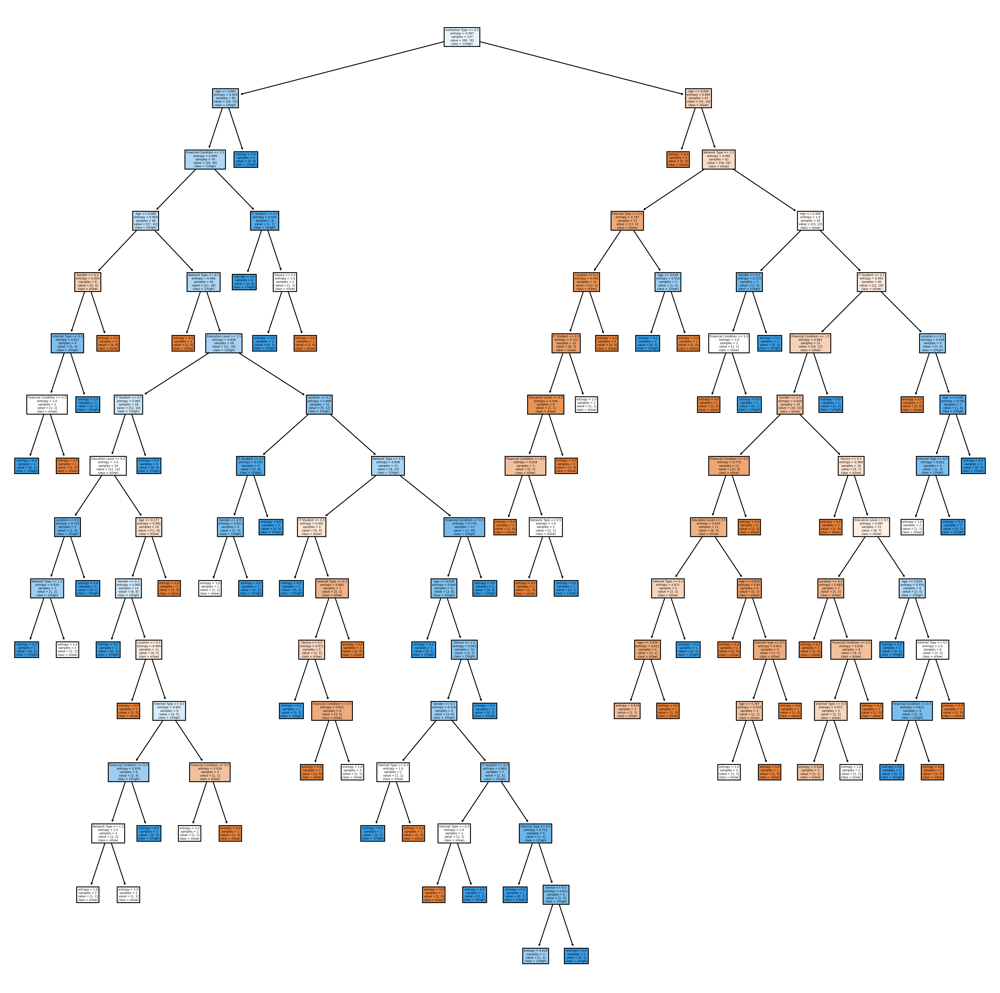

In [24]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 20), dpi=300)


class_labels = {0: 'o(low)' , 1:'1(high)'}

tree.plot_tree(clf,
               feature_names=fn,
               class_names=[class_labels[0], class_labels[1]], 
               filled=True
               )

plt.show()

### confusion matrix :

[[34 20]
 [17 28]]


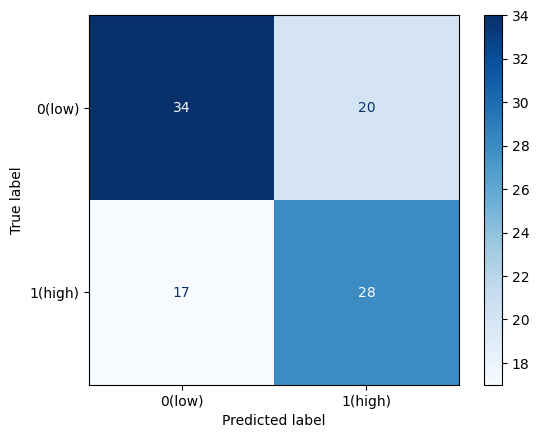

In [25]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Compute and print the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)


# Assuming you already have cm, y_test, and y_pred computed
cm = confusion_matrix(y_test, y_pred)

class_labels = {0: '0(low)', 1: '1(high)'}
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[class_labels[0], class_labels[1]])
disp.plot(cmap=plt.cm.Blues)
plt.show()

In [26]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Compute and print the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print("confusion matrix : \n",cm)

# Compute Accuracy
accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Error Rate is simply 1 minus the Accuracy
error_rate = 1 - accuracy
print("Error Rate:", error_rate)

# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm[1, 1]
TN = cm[0, 0]
FP = cm[0, 1]
FN = cm[1, 0]

# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)

# Specificity 
specificity = TN / (TN + FP)
print("Specificity:", specificity)

# Precision 
precision = TP / (TP + FP)
print("Precision:", precision)

confusion matrix : 
 [[34 20]
 [17 28]]
Accuracy: 0.6262626262626263
Error Rate: 0.3737373737373737
Sensitivity: 0.6222222222222222
Specificity: 0.6296296296296297
Precision: 0.5833333333333334


Accuracy:
Accuracy measures the proportion of correctly classified instances out of total instances.
In this case, the accuracy is approximately 62.63%, indicating that around 62.63% of instances are correctly classified.
- - - - - - -
Error Rate:
Error Rate (Misclassification Rate) measures the proportion of incorrectly classified instances out of total instances.
The error rate is approximately 37.37%, meaning that about 37.37% of instances are misclassified.
- - - - - - -
Sensitivity (True Positive Rate):
Sensitivity measures the proportion of actual positive instances that are correctly identified.
The sensitivity is approximately 62.22%, suggesting that around 62.22% of actual positive instances are correctly identified.
- - - - - - - -
Specificity (True Negative Rate):
Specificity measures the proportion of actual negative instances that are correctly identified.
The specificity is approximately 62.96%, indicating that about 62.96% of actual negative instances are correctly identified.
- - - - - - - - -
Precision (Positive Predictive Value):
Precision measures the proportion of correctly predicted positive instances out of total predicted positive instances.
The precision is approximately 58.33%, indicating that about 58.33% of the instances predicted as positive are actually positive.
- - - - - - -
Overall, the model achieves moderate accuracy, but there is room for improvement. The sensitivity and specificity values are relatively close, indicating that the model performs similarly in correctly identifying both positive and negative instances. The precision is also moderate, suggesting that the model's positive predictions are reasonably accurate. However, further analysis and model refinement may be necessary to improve its performance.


## Gini Index:

In [27]:
from sklearn.tree import DecisionTreeClassifier
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

clf = DecisionTreeClassifier(criterion='gini')

clf = clf. fit (X_train, y_train)

y_pred = clf.predict (X_test)

### Decision Trees:

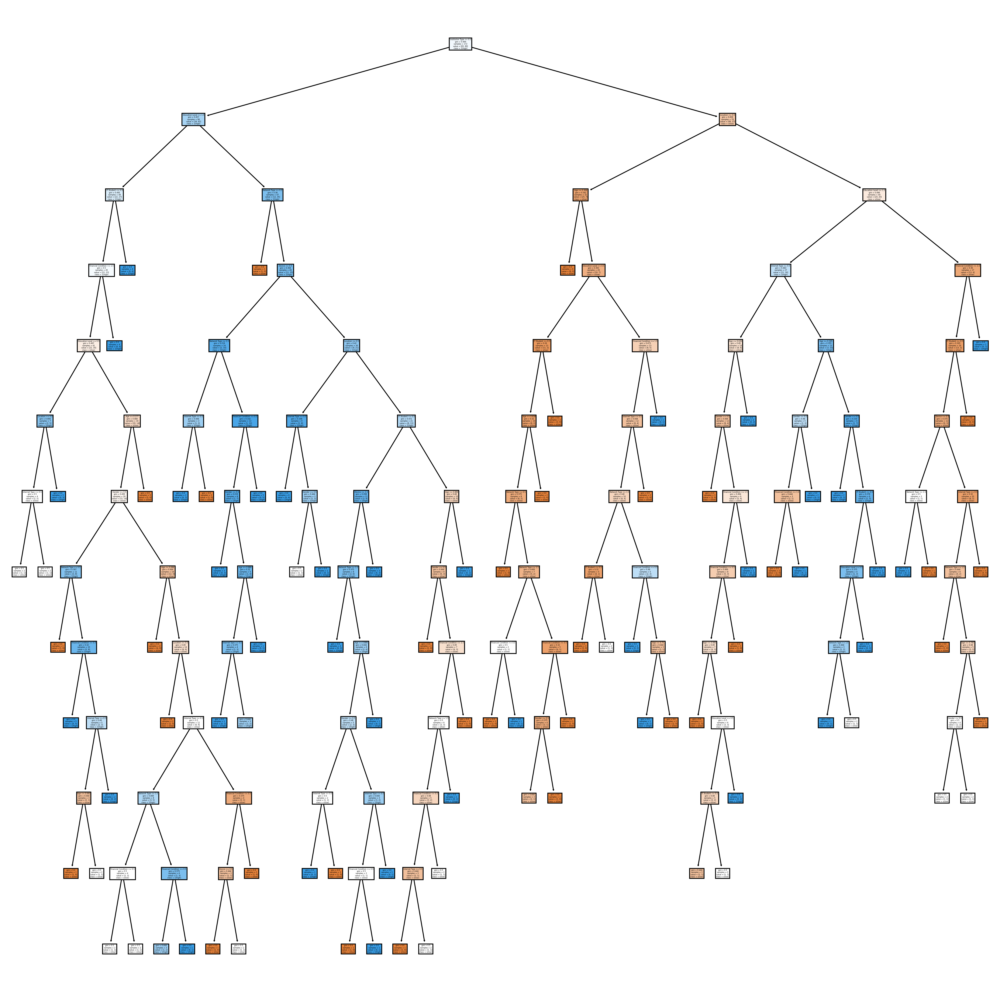

In [28]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 20), dpi=300)


class_labels = {0: 'o(low)' , 1:'1(high)'}

tree.plot_tree(clf,
               feature_names=fn,
               class_names=[class_labels[0], class_labels[1]], 
               filled=True
               )

plt.show()

### confusion matrix:

[[31  9]
 [16 18]]


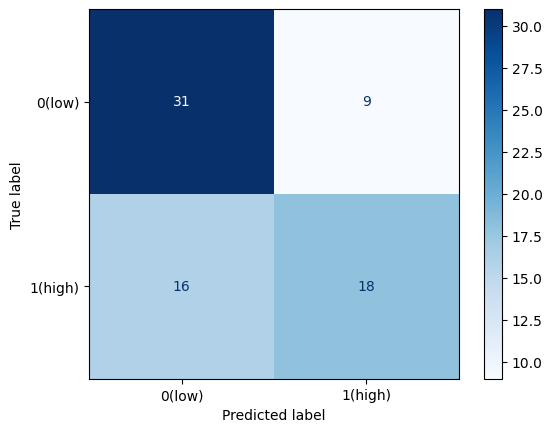

In [29]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Compute and print the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)


# Assuming you already have cm, y_test, and y_pred computed
cm = confusion_matrix(y_test, y_pred)

class_labels = {0: '0(low)', 1: '1(high)'}
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[class_labels[0], class_labels[1]])
disp.plot(cmap=plt.cm.Blues)
plt.show()

In [30]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Compute and print the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print("confusion matrix : \n",cm)

# Compute Accuracy
accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Error Rate is simply 1 minus the Accuracy
error_rate = 1 - accuracy
print("Error Rate:", error_rate)

# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm[1, 1]
TN = cm[0, 0]
FP = cm[0, 1]
FN = cm[1, 0]

# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)

# Specificity 
specificity = TN / (TN + FP)
print("Specificity:", specificity)

# Precision 
precision = TP / (TP + FP)
print("Precision:", precision)

confusion matrix : 
 [[31  9]
 [16 18]]
Accuracy: 0.6621621621621622
Error Rate: 0.33783783783783783
Sensitivity: 0.5294117647058824
Specificity: 0.775
Precision: 0.6666666666666666


Accuracy:
Accuracy measures the proportion of correctly classified instances out of total instances.
In this case, the accuracy is approximately 66.22%, indicating that around 66.22% of instances are correctly classified.
- - - - -
Error Rate:
Error Rate (Misclassification Rate) measures the proportion of incorrectly classified instances out of total instances.
The error rate is approximately 33.78%, meaning that about 33.78% of instances are misclassified.
- - - - - -
Sensitivity (True Positive Rate):
Sensitivity measures the proportion of actual positive instances that are correctly identified.
The sensitivity is approximately 52.94%, suggesting that only 52.94% of actual positive instances are correctly identified.
- - - - - -
Specificity (True Negative Rate):
Specificity measures the proportion of actual negative instances that are correctly identified.
The specificity is approximately 77.5%, indicating that about 77.5% of actual negative instances are correctly identified.
- - - - - 
Precision (Positive Predictive Value):
Precision measures the proportion of correctly predicted positive instances out of total predicted positive instances.
The precision is approximately 66.67%, meaning that about 66.67% of the instances predicted as positive are actually positive.
- - - - -
Overall, the model achieves relatively good accuracy and precision, with a moderate error rate. However, the sensitivity could be improved, indicating that the model's ability to correctly identify positive instances is not as strong. This may suggest a need for further optimization or adjustments in the model to enhance its performance, especially in correctly identifying positive instances.

## Splitting Data into: 80% Training and 20% Test

### - Information Gain (entropy):

In [31]:
from sklearn.tree import DecisionTreeClassifier
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

clf = DecisionTreeClassifier(criterion='entropy')

clf = clf. fit (X_train, y_train)

y_pred = clf.predict (X_test)

## decision tree : 

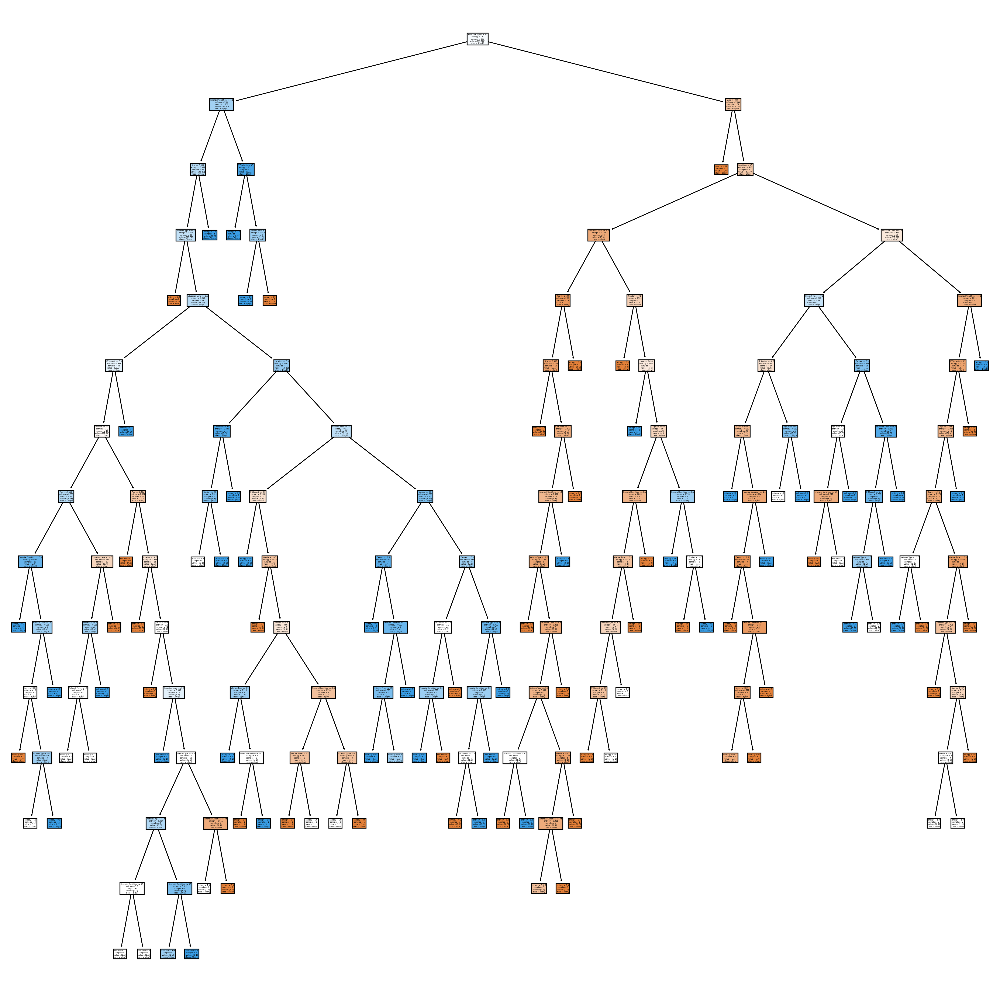

In [32]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 20), dpi=300)


class_labels = {0: 'o(low)' , 1:'1(high)'}

tree.plot_tree(clf,
               feature_names=fn,
               class_names=[class_labels[0], class_labels[1]], 
               filled=True
               )

plt.show()

## confusion matrix:

[[19  8]
 [11 12]]


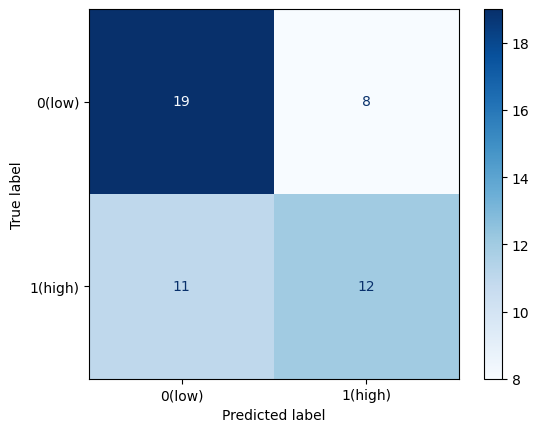

In [33]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Compute and print the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)


# Assuming you already have cm, y_test, and y_pred computed
cm = confusion_matrix(y_test, y_pred)

class_labels = {0: '0(low)', 1: '1(high)'}
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[class_labels[0], class_labels[1]])
disp.plot(cmap=plt.cm.Blues)
plt.show()

In [34]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Compute and print the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print("confusion matrix : \n",cm)

# Compute Accuracy
accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Error Rate is simply 1 minus the Accuracy
error_rate = 1 - accuracy
print("Error Rate:", error_rate)

# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm[1, 1]
TN = cm[0, 0]
FP = cm[0, 1]
FN = cm[1, 0]

# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)

# Specificity 
specificity = TN / (TN + FP)
print("Specificity:", specificity)

# Precision 
precision = TP / (TP + FP)
print("Precision:", precision)

confusion matrix : 
 [[19  8]
 [11 12]]
Accuracy: 0.62
Error Rate: 0.38
Sensitivity: 0.5217391304347826
Specificity: 0.7037037037037037
Precision: 0.6


Accuracy:
Accuracy measures the proportion of correctly classified instances out of total instances.
In this case, the accuracy is 62%, indicating that around 62% of instances are correctly classified.
- - - - 
Error Rate:
Error Rate (Misclassification Rate) measures the proportion of incorrectly classified instances out of total instances.
The error rate is 38%, meaning that about 38% of instances are misclassified.
 - - - - 
Sensitivity (True Positive Rate):
Sensitivity measures the proportion of actual positive instances that are correctly identified.
The sensitivity is approximately 52.17%, suggesting that around 52.17% of actual positive instances are correctly identified.
- - - - - 
Specificity (True Negative Rate):
Specificity measures the proportion of actual negative instances that are correctly identified.
The specificity is approximately 70.37%, indicating that about 70.37% of actual negative instances are correctly identified.
- - - - - -
Precision (Positive Predictive Value):
Precision measures the proportion of correctly predicted positive instances out of total predicted positive instances.
The precision is 60%, indicating that around 60% of the instances predicted as positive are actually positive.
- - - - - 
Overall, the model achieves moderate accuracy and precision, with a relatively high error rate. While the specificity is decent, indicating a good ability to identify negative instances, the sensitivity and precision could be improved. This suggests that the model may need further refinement or adjustments to better identify positive instances and reduce misclassifications.







### Gini Index:

In [35]:
from sklearn.tree import DecisionTreeClassifier
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

clf = DecisionTreeClassifier(criterion='gini')

clf = clf. fit (X_train, y_train)

y_pred = clf.predict (X_test)

### Decision Trees:

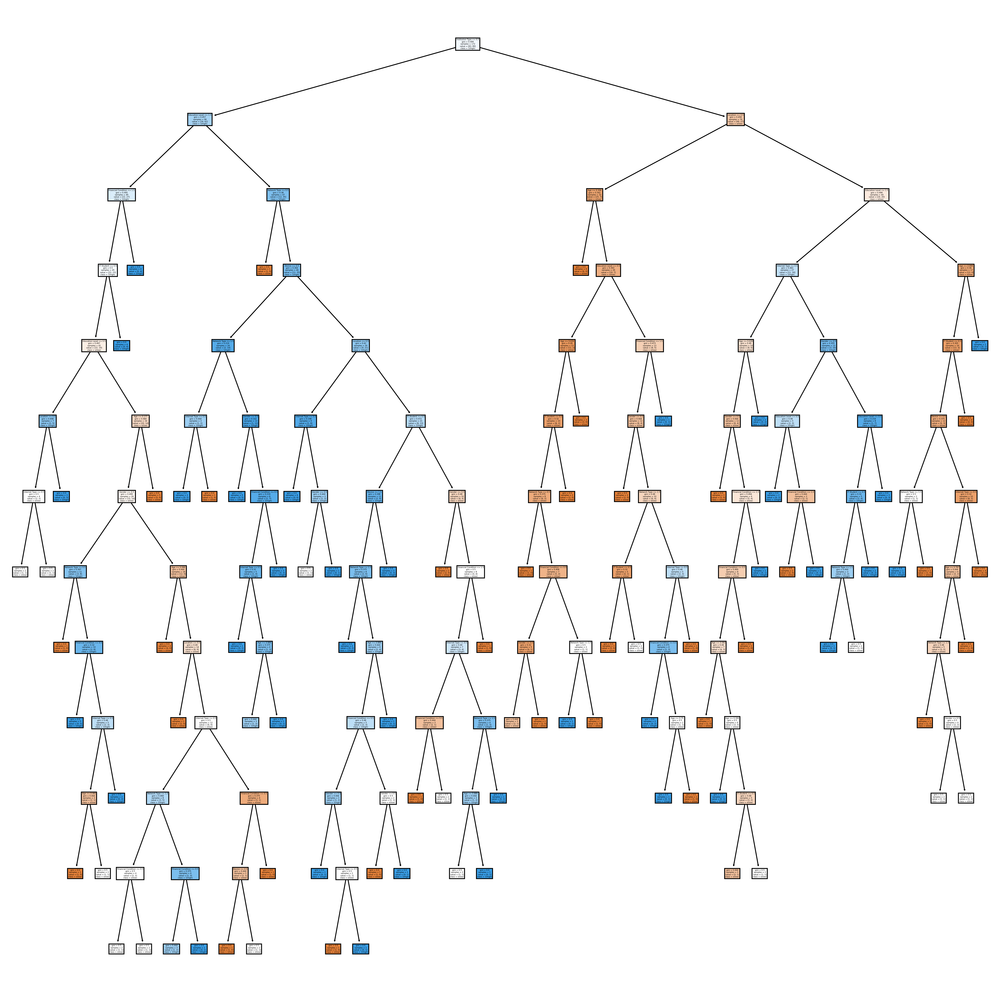

In [36]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 20), dpi=300)


class_labels = {0: 'o(low)' , 1:'1(high)'}

tree.plot_tree(clf,
               feature_names=fn,
               class_names=[class_labels[0], class_labels[1]], 
               filled=True
               )

plt.show()

### confusion matrix:

[[27 13]
 [16 18]]


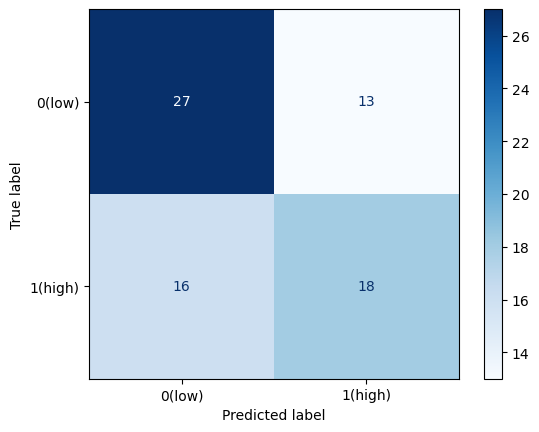

In [37]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Compute and print the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)


# Assuming you already have cm, y_test, and y_pred computed
cm = confusion_matrix(y_test, y_pred)

class_labels = {0: '0(low)', 1: '1(high)'}
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[class_labels[0], class_labels[1]])
disp.plot(cmap=plt.cm.Blues)
plt.show()

In [38]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Compute and print the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print("confusion matrix : \n",cm)

# Compute Accuracy
accuracy = metrics.accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Error Rate is simply 1 minus the Accuracy
error_rate = 1 - accuracy
print("Error Rate:", error_rate)

# Sensitivity (Recall) and Specificity  require TN, FP, FN, TP :

TP = cm[1, 1]
TN = cm[0, 0]
FP = cm[0, 1]
FN = cm[1, 0]

# Sensitivity (Recall )
sensitivity = TP / (TP + FN)
print("Sensitivity:", sensitivity)

# Specificity 
specificity = TN / (TN + FP)
print("Specificity:", specificity)

# Precision 
precision = TP / (TP + FP)
print("Precision:", precision)

confusion matrix : 
 [[27 13]
 [16 18]]
Accuracy: 0.6081081081081081
Error Rate: 0.3918918918918919
Sensitivity: 0.5294117647058824
Specificity: 0.675
Precision: 0.5806451612903226


Accuracy:
Accuracy measures the proportion of correctly classified instances out of total instances.
In this case, the accuracy is approximately 60.81%, indicating that around 60.81% of instances are correctly classified.
- - - - -
Error Rate:
Error Rate (Misclassification Rate) measures the proportion of incorrectly classified instances out of total instances.
The error rate is approximately 39.19%, meaning that about 39.19% of instances are misclassified.
 -- - - - -
Sensitivity (True Positive Rate):
Sensitivity measures the proportion of actual positive instances that are correctly identified.
The sensitivity is approximately 52.94%, suggesting that around 52.94% of actual positive instances are correctly identified.
- - - - - -
Specificity (True Negative Rate):
Specificity measures the proportion of actual negative instances that are correctly identified.
The specificity is approximately 67.5%, indicating that about 67.5% of actual negative instances are correctly identified.
- - - - - -
Precision (Positive Predictive Value):
Precision measures the proportion of correctly predicted positive instances out of total predicted positive instances.
The precision is approximately 58.06%, meaning that about 58.06% of the instances predicted as positive are actually positive.
- - - - - --
Overall, the model achieves moderate accuracy, but there is room for improvement, especially in terms of increasing sensitivity. The specificity and precision values are relatively moderate, indicating that the model performs decently in correctly identifying negative instances and making positive predictions. However, efforts may be needed to enhance its ability to correctly identify positive instances.

### Results - Entropy 

| Metric| 70 %training set 30% testing set | 60 %training set 40% testing set |80 %training set 20% testing set| 90% Training set 10% Testing set |
| --- | --- | --- |--- | --- |
| Accuracy |   0.64  |   0.626  |   0.62 | 0.6
| Error Rate |   0.35  |  0.37   |  0.38   |0.4
| Sensitivity |   0.5  |   0.6222 |  0.521  | 0.63
| Specificity  |    0.775  |   0.629   |  0.703   |0.57
| Precision  |    0.653  |    0.5833  |  0.6   |0.53

Accuracy: This metric represents the overall correctness of the model's predictions. It's the ratio of correctly predicted instances to the total instances. Higher accuracy indicates better performance. In your case, accuracy ranges from 0.6 to 0.64, with the highest accuracy achieved with a 70% training set and 30% testing set.
- - - -
Error Rate: This is the complement of accuracy, representing the proportion of incorrect predictions. Lower error rate is better. Your error rates range from 0.35 to 0.4, with the lowest error rate achieved with a 70% training set and 30% testing set.
- - - - -
Sensitivity (True Positive Rate): Sensitivity measures the proportion of actual positive cases that were correctly identified by the model. It's important, especially in scenarios where correctly identifying positives is crucial. Sensitivity ranges from 0.5 to 0.63, with the highest sensitivity achieved with a 90% training set and 10% testing set.
- - - - -
Specificity (True Negative Rate): Specificity measures the proportion of actual negative cases that were correctly identified by the model. It's essential in scenarios where correctly identifying negatives is crucial. Specificity ranges from 0.57 to 0.775, with the highest specificity achieved with a 70% training set and 30% testing set.
- - - - -
Precision: Precision measures the proportion of true positive cases among all positive predictions made by the model. It's important in scenarios where the cost of false positives is high. Precision ranges from 0.53 to 0.653, with the highest precision achieved with a 70% training set and 30% testing set.
- - - - -
Overall, the model trained with a 70% training set and 30% testing set seems to perform relatively better across most metrics compared to other splits. However, the choice of the best model depends on the specific requirements of your application and which metrics are more critical for your use case.

### Results - Gini 

| Metric| 70 %training set 30% testing set | 60 %training set 40% testing set |80 %training set 20% testing set| 90% training set 10% testing set
| --- | --- | --- |--- | ---|
| Accuracy |   0.60  |  0.6621  |  0.62 | 0.608
| Error Rate |  0.39   | 0.337   |  0.337   |0.391
| Sensitivity |   0.52  |  0.529 |   0.529  |0.529
| Specificity  |    0.675  |  0.775   |  0.775   |0.675
| Precision  |    0.58  |    0.6666  |  0.6666   |0.580

Accuracy:
It measures the overall correctness of the model. The highest accuracy is achieved when using 70% training and 30% testing data, with a value of 0.64. As the training percentage decreases and the testing percentage increases, the accuracy generally decreases, which is expected as the model has less data to learn from and less data to validate its performance.
- - - - 
Error Rate:
This is the complement of accuracy, measuring the proportion of incorrect predictions. The error rate increases as the testing percentage increases, indicating that the model's performance worsens when tested on more unseen data.
- - -  -
Sensitivity (True Positive Rate):
It measures the proportion of actual positives that are correctly identified by the model. The highest sensitivity is achieved when using 90% training and 10% testing data, with a value of 0.63. This indicates that the model trained with a higher proportion of data is better at correctly identifying positive cases.
-  - - - -
Specificity (True Negative Rate):
It measures the proportion of actual negatives that are correctly identified by the model. In this case, the highest specificity is achieved when using 70% training and 30% testing data, with a value of 0.775. Similarly to sensitivity, this indicates that the model trained with a higher proportion of data is better at correctly identifying negative cases.
- - - - -
Precision:
It measures the proportion of true positive predictions out of all positive predictions made by the model. The highest precision is achieved when using 70% training and 30% testing data, with a value of 0.653. This indicates that this model produces fewer false positives compared to the others.
-  - - - -
Overall, the analysis suggests that the performance of the model varies depending on the distribution of training and testing data. However, generally, higher training percentages lead to better performance, as indicated by higher sensitivity, specificity, and precision.

# Clustering

In this task, we use the K-means clustering algorithm to group the students into clusters with different number of clusters. We evaluate the K-Means algorithms using  silhouette coefficient and Total Within-Cluster Sum of Squares and we plot the Elbow curve to determine the optimal number of clusters.

##  k-means

In [1]:
import pandas as pd
from sklearn.preprocessing import StandardScaler

# Load the preprocessed dataset
df = pd.read_csv("Processed_dataset.csv")  

# Extract the features (excluding the target variable, if any)
features = df.drop('Flexibility Level', axis=1) 

# Use StandardScaler to scale the features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)  # Create a new DataFrame with the scaled features

df_scaled = pd.DataFrame(scaled_features, columns=features.columns)

# Display the scaled DataFrame
print("\nScaled DataFrame:")
print(df_scaled.head())


Scaled DataFrame:
   Education Level  Institution Type    Gender       Age    Device  \
0         0.963100         -0.906765  0.834597  0.815428  2.792654   
1         0.963100         -0.906765 -1.198183  0.815428  0.330314   
2        -1.612146          1.102822 -1.198183 -0.092652  0.330314   
3        -0.324523         -0.906765 -1.198183 -1.363963  0.330314   
4        -0.324523         -0.906765 -1.198183 -0.092652  0.330314   

   IT Student  Location  Financial Condition  Internet Type  Network Type  
0   -0.649589  0.662266            -0.609711       1.139766      0.757122  
1   -0.649589  0.662266            -0.609711      -0.877373      0.757122  
2   -0.649589  0.662266            -0.609711       1.139766      0.757122  
3   -0.649589  0.662266            -0.609711      -0.877373      0.757122  
4   -0.649589  0.662266             0.890178      -0.877373     -1.016706  


#### - now we need to chosee 3 different sizes of K-means clustring

## Silhouette method

/lib/python3.11/site-packages/threadpoolctl.py:1019: RuntimeWarning: libc not found. The ctypes module in Python 3.11 is maybe too old for this OS.
  warnings.warn(


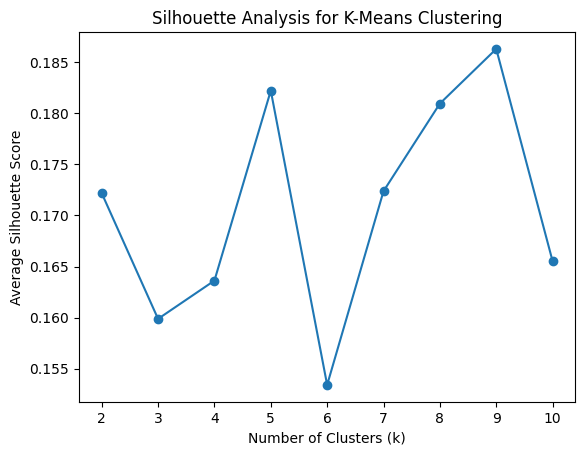

The highest average Silhouette score is 0.18629993253012986 with k=9.
The second highest average Silhouette score is 0.1822158323860628 with k=5.


In [2]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.datasets import load_iris
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Perform k-means clustering with different values of k
k_values = range(2, 11)
silhouette_avg_values = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
    kmeans_result = kmeans.fit_predict(df_scaled)
    silhouette_avg = silhouette_score(df_scaled, kmeans_result)
    silhouette_avg_values.append(silhouette_avg)

# Find the best number of clusters based on the highest average Silhouette score
best_k = k_values[np.argmax(silhouette_avg_values)]
best_score = max(silhouette_avg_values)

# Find the second highest average Silhouette score and its corresponding number of clusters
silhouette_avg_values_sorted = sorted(silhouette_avg_values, reverse=True)
second_best_score = silhouette_avg_values_sorted[1]
second_best_k = k_values[silhouette_avg_values.index(second_best_score)]

# Plot the silhouette scores for different values of k
plt.plot(k_values, silhouette_avg_values, marker='o')
plt.title('Silhouette Analysis for K-Means Clustering')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Average Silhouette Score')
plt.show()

print(f"The highest average Silhouette score is {best_score} with k={best_k}.")
print(f"The second highest average Silhouette score is {second_best_score} with k={second_best_k}.")

## Elbow method

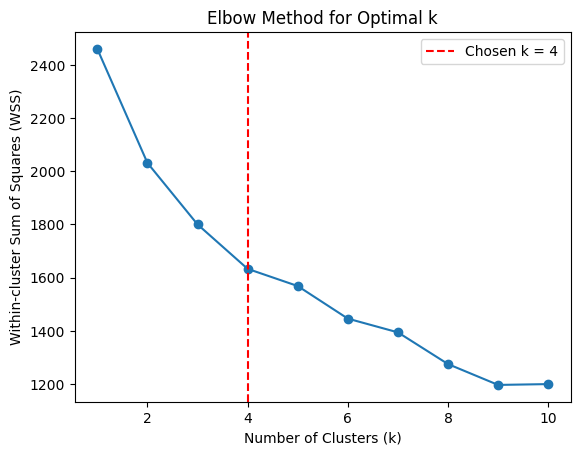

In [4]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.datasets import load_iris
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
import piplite
await piplite.install('kneed')
from kneed import KneeLocator

X = df_scaled

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Perform k-means clustering for different values of k
wss_values = []
k_values = range(1, 11)

for k in k_values:
    kmeans = make_pipeline(StandardScaler(), KMeans(n_clusters=k, n_init='auto'))
    kmeans.fit(X_scaled)
    wss_values.append(kmeans.named_steps['kmeans'].inertia_)

# Plot the elbow method
plt.plot(k_values, wss_values, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Within-cluster Sum of Squares (WSS)')
plt.title('Elbow Method for Optimal k')

# Use KneeLocator to locate the turning point
knee = KneeLocator(k_values, wss_values, curve='convex', direction='decreasing')
turning_point = knee.elbow

plt.axvline(x=turning_point, linestyle='--', color='red', label=f'Chosen k = {turning_point}')
plt.legend()
plt.show()

The best number of clusters in a dataset for K-means clustering can be found using the Elbow method. The number of clusters at which adding more clusters does not significantly reduce the inertia is represented by the Elbow point. The inertia measures how compact the clusters are. The Elbow technique aids in striking a balance between preventing overfitting and having a low moment of inertia.

## k= 9 

In [19]:
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

np.random.seed(45)

# Perform K-means clustering for K=9 
kmeans = KMeans(n_clusters=9, random_state=45, n_init='auto')  # Set n_init explicitly and init='auto'
kmeans_result = kmeans.fit(df_scaled)

# Print the clustering result
print("Cluster Centers:")
print(kmeans_result.cluster_centers_)
print("\nCluster Labels:")
print(kmeans_result.labels_)

Cluster Centers:
[[-1.1400173   1.10282193  0.36028137 -0.32742951  0.33031395 -0.21178367
   0.51745064 -0.55971448  0.198434    0.52061141]
 [-0.77239165  1.10282193  0.746215   -0.14114309  0.33031395 -0.36406364
  -1.41552197  0.36847737 -0.78967176 -0.63109163]
 [ 0.96310002 -0.48810082  0.41110087  0.79272619 -2.13202639  1.17459852
   0.30022733 -0.48472005  0.63548077 -0.0558828 ]
 [-0.32452283 -0.73451442 -0.15275363 -1.28971977  0.25996137 -0.33687079
   0.66226618  0.46163815 -0.87737345 -0.15513272]
 [ 0.96310002 -0.30388871  0.02148467  1.03336733 -1.63955832  1.10163104
   0.66226618  2.09008849  0.93805161  0.75712186]
 [-0.63532835 -0.76817252 -0.42712889 -0.92298047 -0.09422749 -0.64958858
   0.512457    0.37297479  1.13976551  0.57362237]
 [ 0.96310002 -0.48048875  0.21860275  0.79891764  0.40493032  1.40676779
  -0.12763675 -0.2915526  -0.08274295 -0.801697  ]
 [-1.06030732  0.43295972 -1.00458533 -0.4007377   0.33031395 -0.64958858
  -1.30308755 -0.46686424 -0.87737

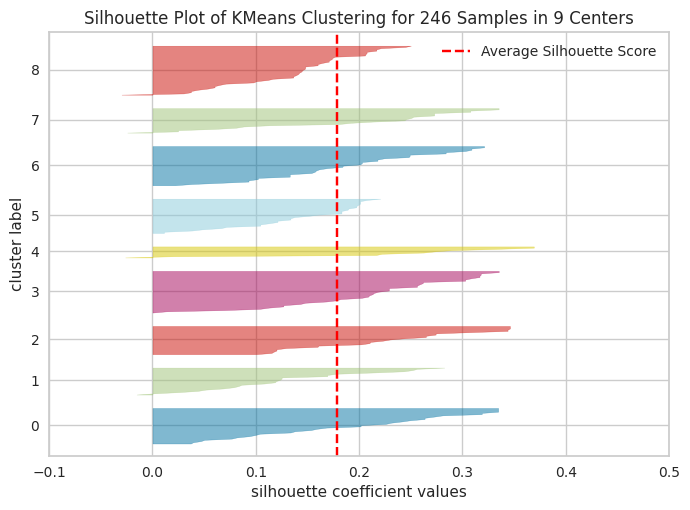

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 246 Samples in 9 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [20]:
import piplite
await piplite.install('yellowbrick')
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=9,n_init='auto')
visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')
visualizer.fit(df_scaled)
visualizer.show()

In [26]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import pandas as pd

# Assuming X_scaled is your scaled data
X = df_scaled

# Perform k-means clustering with k=9
kmeans = KMeans(n_clusters=9, random_state=45, n_init='auto')
kmeans.fit(X_scaled)
labels = kmeans.labels_

# Compute the WSS (Within-Cluster Sum of Squares)
wss = kmeans.inertia_

# Compute the Average Silhouette Score
silhouette_avg = silhouette_score(X, labels)

# Print the evaluation metrics
print("WSS:", wss)
print("Average Silhouette Score:", silhouette_avg)

WSS: 1202.1795760464634
Average Silhouette Score: 0.1784279148509518


The Average Silhouette Score of 0.1784 in your case indicates a moderate level of clustering structure in the data. It suggests that the clusters are reasonably well-separated and distinct, with some overlap between clusters.
- - - - - - 
the WSS value of 1202.1796 suggests that the data points within the clusters have relatively small distances to their centroids, indicating compact clusters.

### k =5 

In [27]:
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

np.random.seed(60)

# Perform K-means clustering for K=5
kmeans = KMeans(n_clusters=5, random_state=60, n_init='auto')  # Set n_init explicitly and init='auto'
kmeans_result = kmeans.fit(df_scaled)

# Print the clustering result
print("Cluster Centers:")
print(kmeans_result.cluster_centers_)
print("\nCluster Labels:")
print(kmeans_result.labels_)

Cluster Centers:
[[ 9.63100018e-01 -5.58951629e-01  3.26401697e-01  8.74802629e-01
  -1.18497241e+00  1.20266294e+00  4.95171327e-01  5.37014478e-02
   6.74271905e-01  6.65601632e-03]
 [-5.82047402e-01  1.06628399e+00 -5.24346109e-02  1.40275475e-01
   3.75083772e-01 -4.10785901e-01  2.67314712e-01 -5.00627963e-01
   3.95078954e-02  5.31361884e-01]
 [ 1.52374520e-01  5.81817991e-01  3.45223735e-01  2.27649763e-01
   3.75912843e-01 -9.88719294e-04 -1.38928727e+00 -8.19722245e-02
  -7.65310175e-01 -7.21068434e-01]
 [-3.47934157e-01 -8.70226762e-01 -6.43788847e-01 -6.24291022e-01
   1.06464826e-01 -4.50586347e-01  3.46305005e-01 -4.18815864e-01
   3.95078954e-02 -8.14151814e-02]
 [-2.38681309e-01 -4.37861153e-01  8.92440082e-02 -1.03873229e+00
   4.94469970e-01 -5.03653608e-01  5.17450641e-01  1.74011451e+00
   6.39580647e-02  4.61483798e-01]]

Cluster Labels:
[1 3 1 3 3 4 3 3 1 3 1 3 3 3 3 4 0 1 3 4 1 3 3 1 3 0 3 3 0 0 1 3 2 3 0 0 0
 0 4 0 2 4 1 3 3 2 0 1 3 3 2 2 1 2 1 3 3 1 2 3 2 2 0 0 

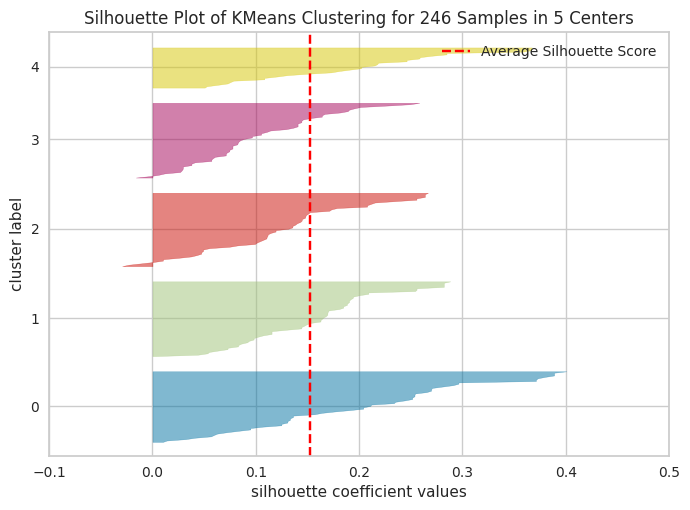

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 246 Samples in 5 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [28]:
import piplite
await piplite.install('yellowbrick')
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=5,n_init='auto')
visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')
visualizer.fit(df_scaled)
visualizer.show()

In [37]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import pandas as pd

# Assuming X_scaled is your scaled data
X = df_scaled

# Perform k-means clustering with k=5
kmeans = KMeans(n_clusters=5, random_state=60, n_init='auto')
kmeans.fit(X_scaled)
labels = kmeans.labels_

# Compute the WSS (Within-Cluster Sum of Squares)
wss = kmeans.inertia_

# Compute the Average Silhouette Score
silhouette_avg = silhouette_score(X, labels)

# Print the evaluation metrics
print("WSS:", wss)
print("Average Silhouette Score:", silhouette_avg)

WSS: 1550.5511387646532
Average Silhouette Score: 0.1519666106128939


 the WSS value of 1550.5511 suggests that the clusters have a relatively larger spread compared to the previous scenario with WSS 1202.1796. It indicates that the data points within the clusters may be more dispersed, resulting in less compact clusters.
 - - - - - -
 the Average Silhouette Score of 0.152 suggests a moderate level of clustering structure in the data. It indicates that the clusters may not be as well-separated or distinct as in the previous case with a higher Average Silhouette Score of 0.1784.

### k = 8

In [31]:
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

np.random.seed(90)

# Perform K-means clustering for K=8
kmeans = KMeans(n_clusters=8, random_state=90, n_init='auto')  # Set n_init explicitly and init='auto'
kmeans_result = kmeans.fit(df_scaled)

# Print the clustering result
print("Cluster Centers:")
print(kmeans_result.cluster_centers_)
print("\nCluster Labels:")
print(kmeans_result.labels_)

Cluster Centers:
[[ 0.96310002 -0.57866892  0.29528771  0.88214425 -1.2274932   1.31606609
   0.48494103  0.09431852  0.6457723  -0.03929087]
 [ 0.96310002  0.31334147  0.39900099  0.8478596   0.41825467  0.44492368
  -1.35480738 -0.07403631 -0.80533277 -0.44654738]
 [-0.32452283 -0.9067647  -0.44530189 -1.2159799   0.33031395 -0.24421367
   0.5818131  -0.16529936 -0.72795575 -0.62252241]
 [ 0.96310002  0.22362778 -0.37236649  0.87967702  0.48421022 -0.64958858
   0.32285476 -0.46909622  0.3833384   0.3690969 ]
 [-0.72071448 -0.21113856 -0.49452876 -0.68486973 -0.42732923 -0.64958858
   0.49517133 -0.60971076  1.06218324  0.62067352]
 [-1.12493704  0.83125617 -0.04444334 -0.36146565  0.33031395 -0.4721001
  -1.50996689 -0.04218539 -0.71382164 -0.53729343]
 [-0.221513   -0.50484737  0.02148467 -1.16256669  0.52730117 -0.5620276
   0.66226618  1.79011079  0.17153881  0.54426245]
 [-1.37803244  1.10282193  0.55739945 -0.09265159  0.44223851 -0.05258189
   0.66226618 -0.47335726 -0.3272446

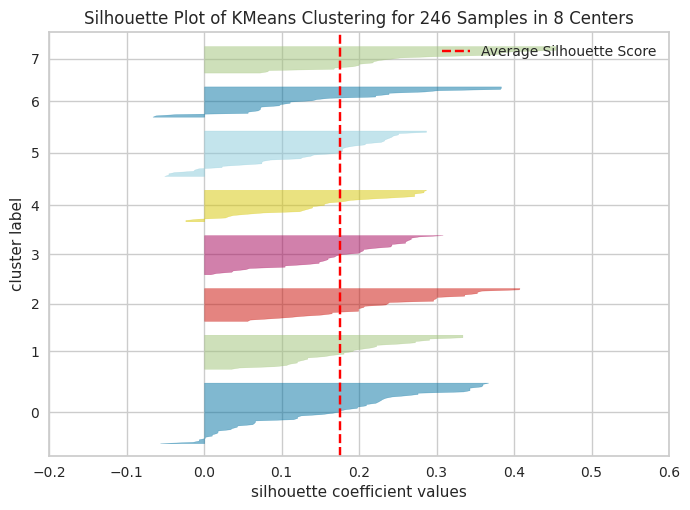

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 246 Samples in 8 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [32]:
import piplite
await piplite.install('yellowbrick')
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=8,n_init='auto')
visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')
visualizer.fit(df_scaled)
visualizer.show()

In [33]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import pandas as pd

# Assuming X_scaled is your scaled data
X = df_scaled

# Perform k-means clustering with k=5
kmeans = KMeans(n_clusters=8, random_state=90, n_init='auto')
kmeans.fit(X_scaled)
labels = kmeans.labels_

# Compute the WSS (Within-Cluster Sum of Squares)
wss = kmeans.inertia_

# Compute the Average Silhouette Score
silhouette_avg = silhouette_score(X, labels)

# Print the evaluation metrics
print("WSS:", wss)
print("Average Silhouette Score:", silhouette_avg)

WSS: 1250.7346543811886
Average Silhouette Score: 0.1749348910251044


 the WSS value of 1250.7347 suggests that the clusters have a relatively smaller spread compared to the previous scenario with WSS 1550.5511. It indicates that the data points within the clusters are more closely packed around their centroids, resulting in more compact clusters.
 - - - - - -
 the Average Silhouette Score of 0.1749 suggests a moderate level of clustering structure in the data. It indicates that the clusters are reasonably well-separated and distinct, with some overlap between clusters.

# Evaluate the best models of Clustring:


|  Metric | K=9 | K=5 | K=8 | 
| --- | --- | --- |--- |
| Average Silhouette width           | 0.1784279148509518 | 0.1519666106128939 | 0.1749348910251044 |
| WSS | 1202.1795760464634 |  1550.5511387646532 | 1250.7346543811886 |

Average Silhouette Width:
The average silhouette width measures how similar an object is to its own cluster compared to other clusters. 
Higher values indicate better-defined clusters.
The values obtained are:
K=9: 0.1784
K=5: 0.1520
K=8: 0.1749
The highest average silhouette width is observed for K=9, indicating that the data points are better separated into clusters with this configuration.
- - - - - - - 
Within-Cluster Sum of Squares (WSS):
WSS measures the compactness of clusters. It represents the sum of squared distances between each data point and its assigned centroid.
The values obtained are:
K=9: 1202.1796
K=5: 1550.5511
K=8: 1250.7347
Lower values of WSS indicate tighter clusters. In this case, K=9 has the lowest WSS, suggesting more compact clusters compared to other configurations.
- - - - - - - 
Based on these metrics, we can conclude that K=9 is the optimal choice for this dataset, as it achieves both a higher average silhouette width and a lower WSS compared to other values of k. This indicates that the data points are better separated into distinct clusters with tighter grouping when K=9 is used for K-means clustering.